In [1]:
import sys
import torch as t
import numpy as np
from matplotlib import pyplot as plt
import json
from itertools import product
sys.path.append('/workspace/wilson/Finite-groups/src')
from model import MLP3, InstancedModule
from evals import load_models
from utils import *
from group_data import *
from jaxtyping import Float
from typing import Union
from einops import repeat
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm
import plotly.graph_objects as go
import copy
import math
from itertools import product
from llc import *
%load_ext autoreload
%autoreload 2

In [2]:
device = t.device("cuda" if t.cuda.is_available() else "cpu")

In [3]:
path = '/workspace/models/2024_07_25_18_08_00_Z_48_2__twZ_48_'
models, params = load_models(path)

100%|██████████| 667/667 [00:31<00:00, 21.07it/s]


In [4]:
dataset = GroupData(params)

Intersection size: 6912/9216 (0.75)
Added 6912 elements from intersection
Added 0 elements from group 0: Z(48,2)
Added 0 elements from group 1: twZ(48)
Train set size: 6912/9216 (0.75)


In [5]:
model0 = models[20][0].to(device)
model1 = models[-1][0].to(device)

In [25]:
#eps_l = [1.3**m for m in range(-80, -20)]
eps_l = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
#eps_l = [1e-6, 2e-6, 5e-6, 1e-5]
beta_l = [0.01, 0.1, 1, 10, 100, 1000, 10000]
#beta_l = [10, 100, 1000]
gamma_l = [1.]
llc0, trace0 = sweep_llc(
    model0, dataset, eps_l, beta_l, gamma_l, chains=1, epochs=3_000, replacement=False, positive=True,#batch_size=128,
)

SGLD:   0%|          | 0/3000 [00:00<?, ?it/s]

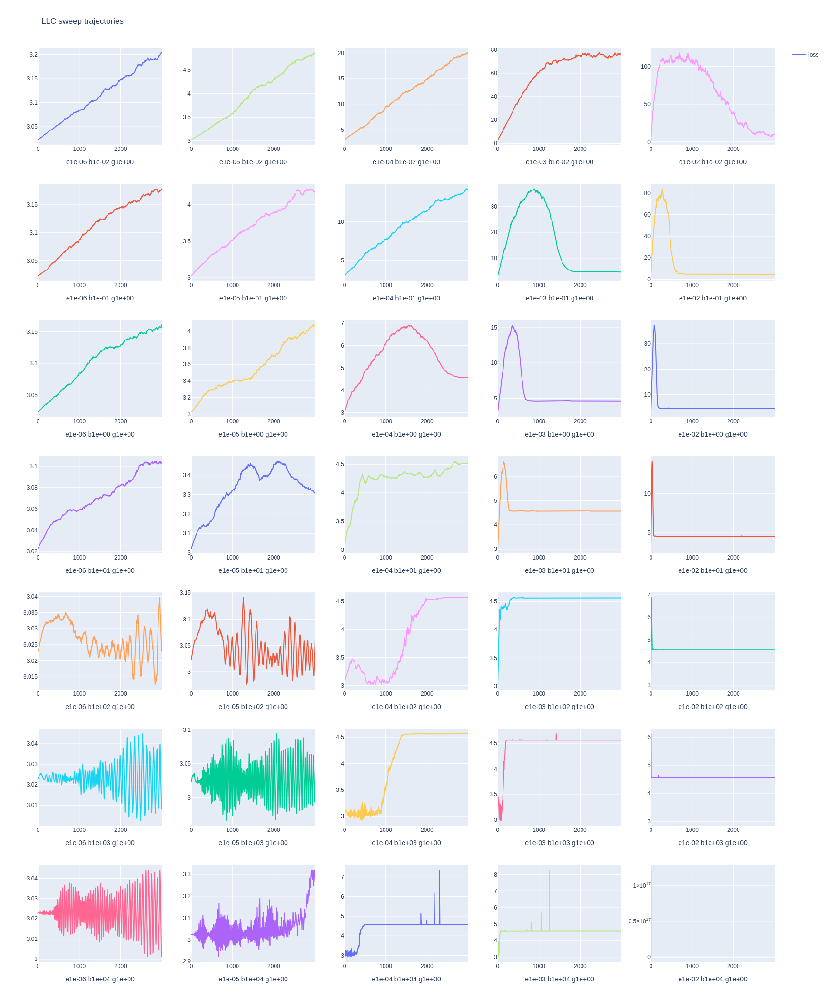

In [26]:
plot_trace_sweep(trace0, eps_l, beta_l, gamma_l).show()

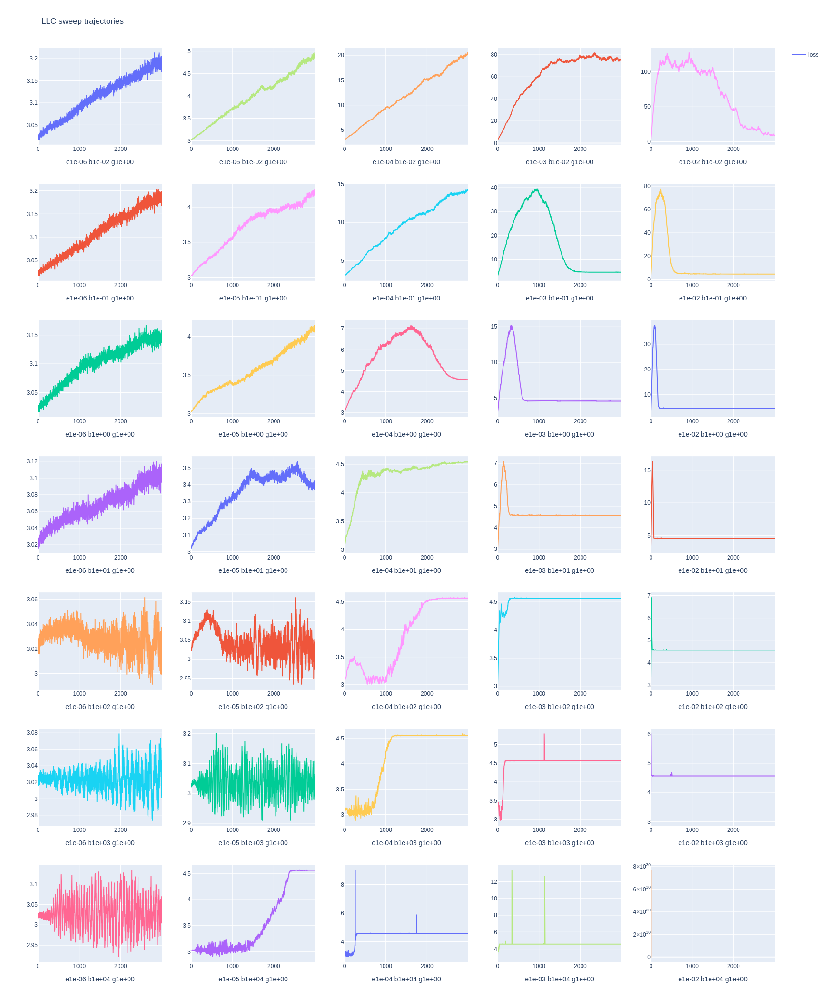

In [17]:
plot_trace_sweep(trace0, eps_l, beta_l, gamma_l).show()

In [22]:
llc1, trace1 = sweep_llc(
    model1, dataset, eps_l, beta_l, gamma_l, chains=1, epochs=3_000, replacement=True, positive=True,
)

SGLD:   0%|          | 0/3000 [00:00<?, ?it/s]

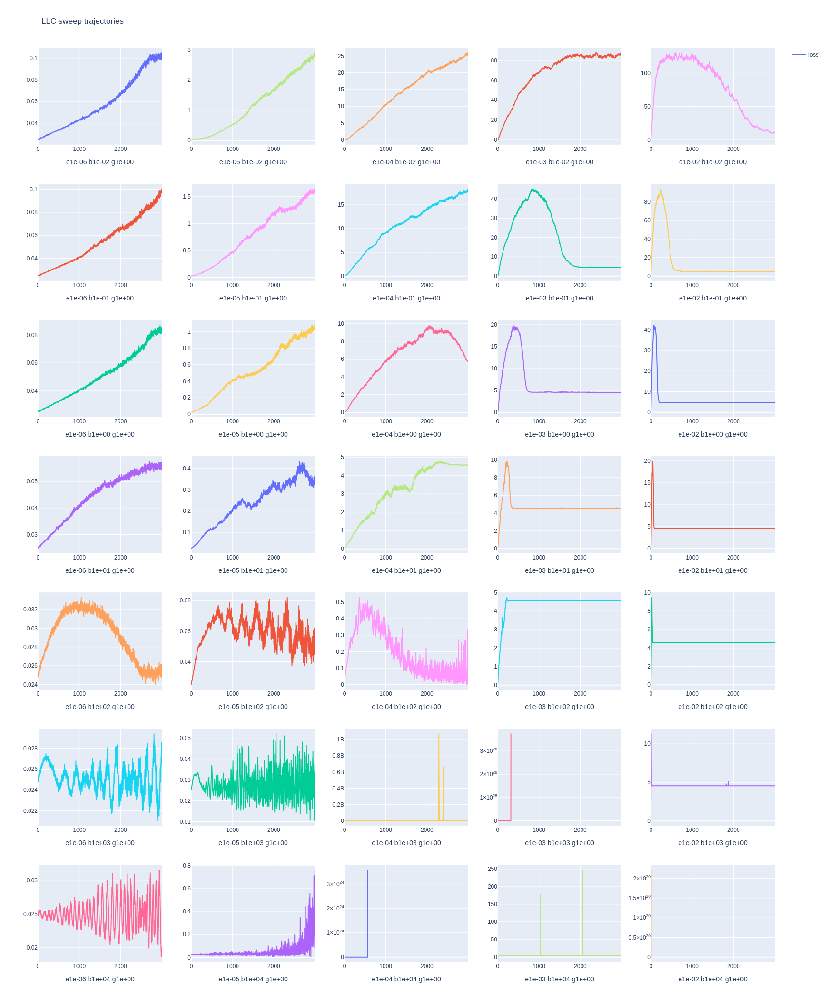

In [23]:
plot_trace_sweep(trace1, eps_l, beta_l, gamma_l).show()

In [28]:
model_traj = MLP3.stack([model[0].to(device) for model in models[:]])

In [29]:
model_traj.num_instances()

667

In [41]:
model_traj = model_traj[:300]

In [42]:
llc, _ = get_llc(
    model_traj, dataset, eps=1e-5, beta=100., gamma=1.0, chains=10, replacement=True, positive=True,#parallel_chain=True,
)

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

SGLD:   0%|          | 0/2000 [00:00<?, ?it/s]

In [43]:
import gc
t.cuda.empty_cache()
gc.collect()

18

In [44]:
loss = full_train_loss(model_traj, dataset)

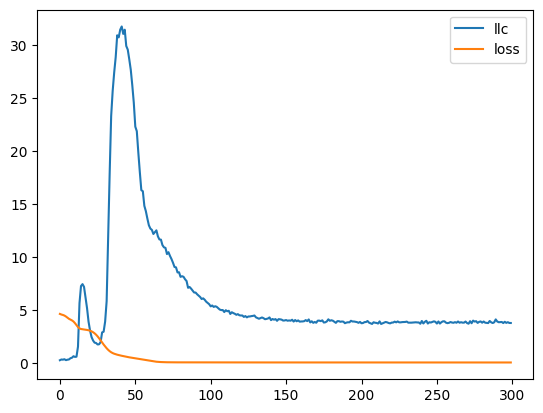

In [45]:
plt.plot(llc.tolist(), label='llc')
plt.plot((loss * 1).tolist(), label='loss')
plt.legend()
plt.show()

In [35]:
llc[20]

tensor(-63.0355, device='cuda:0', grad_fn=<SelectBackward0>)

In [111]:
plt.plot

torch.Size([667])